In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


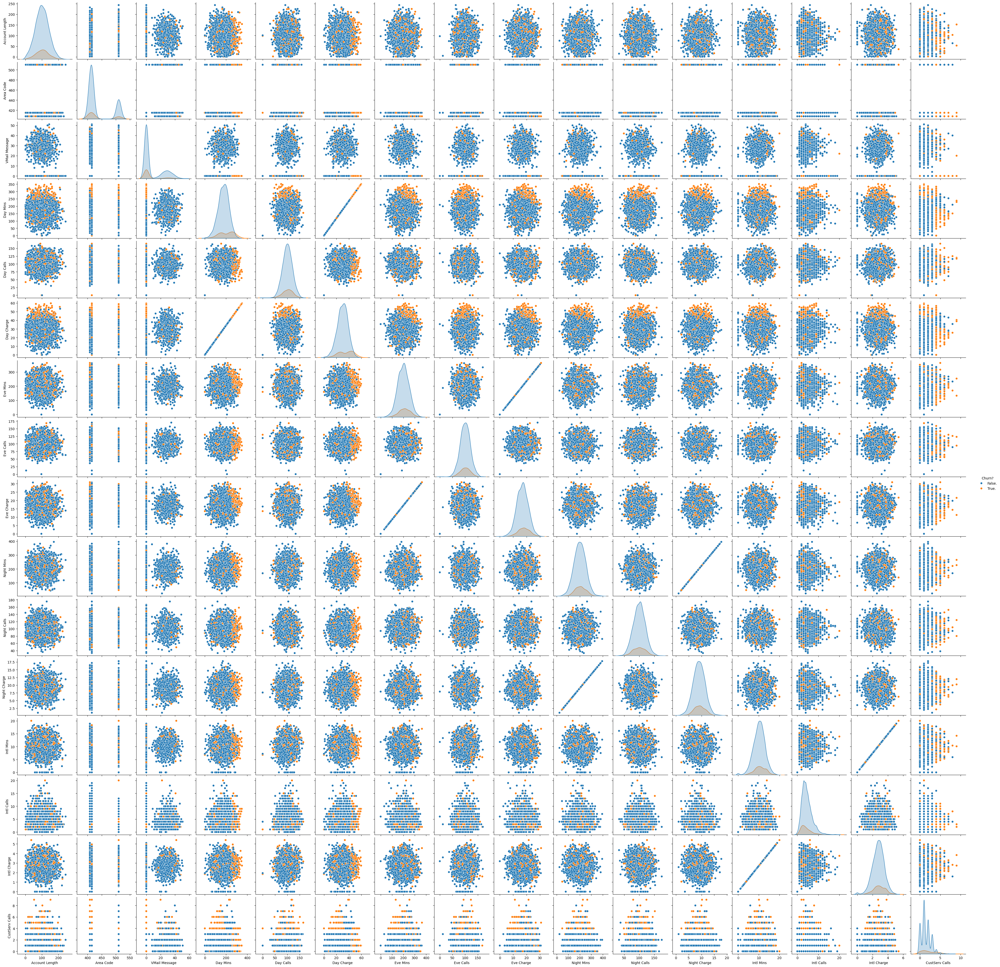

In [3]:
# Load the dataset
df = pd.read_csv('/content/churn.csv')

# Visualize the distribution of numerical features
sns.pairplot(df, hue='Churn?')
plt.show()


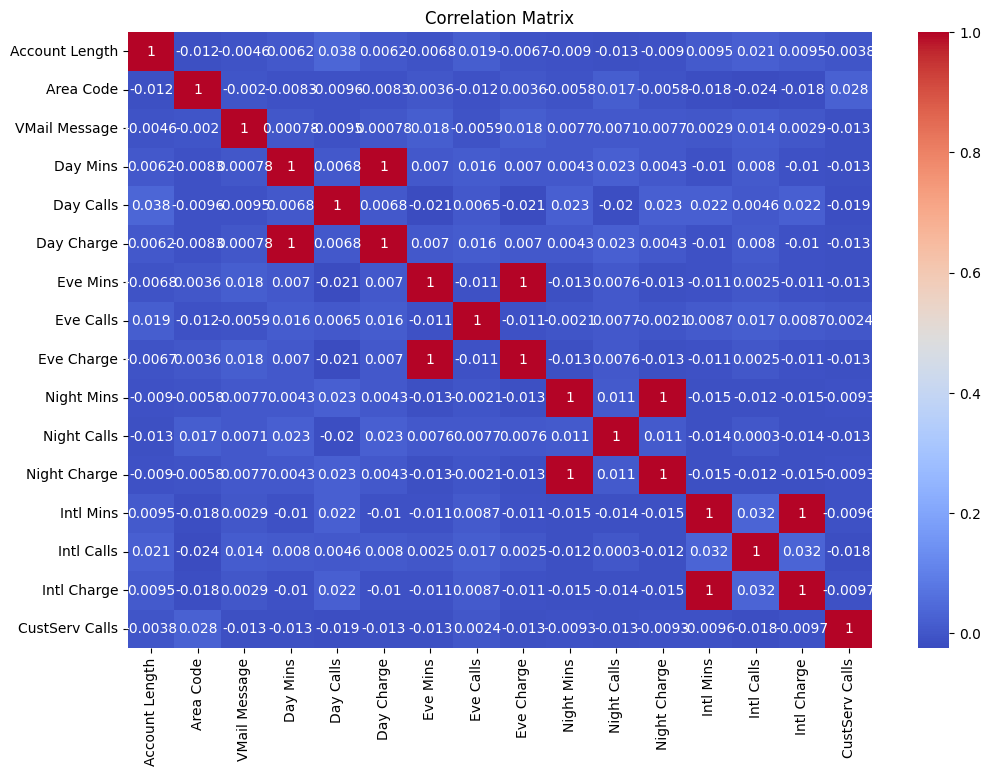

In [7]:
# Visualize the correlation matrix
numeric_features = ['Account Length', 'Area Code', 'VMail Message', 'Day Mins', 'Day Calls',
                    'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge', 'Night Mins',
                    'Night Calls', 'Night Charge', 'Intl Mins', 'Intl Calls', 'Intl Charge',
                    'CustServ Calls']

# Visualize the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(df[numeric_features].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Data preprocessing

---



In [13]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

In [11]:
# Separate features and target variable
X = df.drop(columns=['Churn?'])
y = df['Churn?']

In [12]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [14]:
# Preprocessing pipelines for numerical and categorical data
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_features = ['State', 'Int\'l Plan', 'VMail Plan']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Developing the model

---



In [19]:
# Combine preprocessing and model pipeline
# (Assuming you have an SVM classifier imported as 'SVC')
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', SVC(probability=True))])

# Fit the pipeline on training data
pipeline.fit(X_train, y_train)

# Evaluate the model
accuracy = pipeline.score(X_test, y_test)
print("Accuracy:", accuracy)


Accuracy: 0.9175412293853074


In [20]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import matplotlib.pyplot as plt

In [22]:
# Predictions on test set
y_pred = pipeline.predict(X_test)

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[563   3]
 [ 52  49]]

Classification Report:
              precision    recall  f1-score   support

      False.       0.92      0.99      0.95       566
       True.       0.94      0.49      0.64       101

    accuracy                           0.92       667
   macro avg       0.93      0.74      0.80       667
weighted avg       0.92      0.92      0.91       667

